In [1]:
import os
from PIL import Image
import cv2
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
sns.set_style('whitegrid')
import torch

## Test image

In [2]:
import os
HOME = os.getcwd()
print(HOME)

/content


<>:76: SyntaxWarning: invalid escape sequence '\T'
<>:76: SyntaxWarning: invalid escape sequence '\T'
C:\Users\vlva8\AppData\Local\Temp\ipykernel_10688\2354241589.py:76: SyntaxWarning: invalid escape sequence '\T'
  train_path = os.path.join(HOME, "tomatod-DatasetNinja\Train")


image file path: c:\Users\vlva8\OneDrive\Desktop\advML\final_projects\tomatod-DatasetNinja\Train\img\stereo20190406_065607_p0_snap_436.jpg
json file path: c:\Users\vlva8\OneDrive\Desktop\advML\final_projects\tomatod-DatasetNinja\Train\ann\stereo20190406_065607_p0_snap_436.jpg.json
原始圖片大小: 2000x2000
調整後圖片大小: 256x256
物件類別: unripe, bbox: (242, 1268), (314, 1340)
物件類別: fully-ripe, bbox: (220, 1216), (292, 1288)
物件類別: fully-ripe, bbox: (108, 1292), (190, 1374)
物件類別: semi-ripe, bbox: (747, 358), (831, 442)
物件類別: semi-ripe, bbox: (682, 360), (772, 450)
物件類別: fully-ripe, bbox: (1544, 870), (1628, 954)
物件類別: unripe, bbox: (739, 736), (815, 812)
物件類別: semi-ripe, bbox: (2, 1371), (194, 1563)
物件類別: unripe, bbox: (1195, 819), (1277, 901)
物件類別: unripe, bbox: (1648, 1243), (1712, 1307)
物件類別: unripe, bbox: (1586, 1172), (1650, 1236)
物件類別: unripe, bbox: (1308, 1074), (1390, 1156)
物件類別: unripe, bbox: (1130, 855), (1212, 937)
物件類別: unripe, bbox: (27, 598), (197, 768)


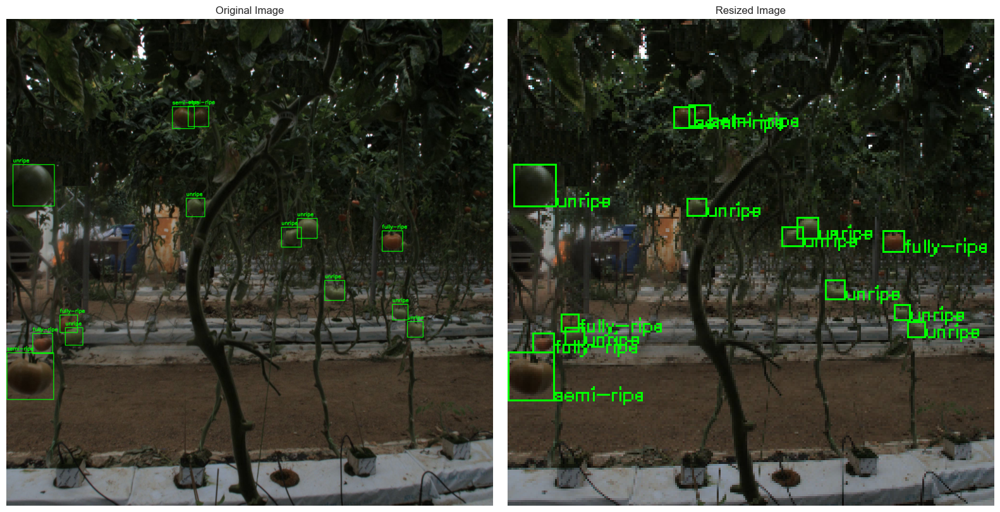

In [ ]:
import json

def visualize_annotation(image_path, json_path, resize=None):
    # 讀取圖片
    img = cv2.imread(image_path)
    if img is None:
        print("Error: 讀取圖片失敗")
        return

    # 讀取 annotation JSON
    with open(json_path, 'r', encoding='utf-8') as f:
        data = json.load(f)

    # 取得原始圖片大小
    img_height, img_width = img.shape[:2]
    print(f"原始圖片大小: {img_width}x{img_height}")

    # 複製原圖，以便同時顯示原圖和處理後的圖
    original_img = img.copy()

    # 如果需要調整大小
    if resize:
        # 記錄縮放比例，用於調整標註框
        scale_x = resize[0] / img_width
        scale_y = resize[1] / img_height
        img = cv2.resize(img, resize)
        print(f"調整後圖片大小: {resize[0]}x{resize[1]}")
    else:
        scale_x, scale_y = 1.0, 1.0

    # 解析並繪製每個物件的 bbox
    for obj in data['objects']:
        class_name = obj['classTitle']

        # 取得 bbox 左上與右下點座標 (x1,y1), (x2,y2)
        (x1, y1), (x2, y2) = obj['points']['exterior']

        # 印出 bbox 資訊
        print(f"物件類別: {class_name}, bbox: ({x1}, {y1}), ({x2}, {y2})")

        # 繪製矩形框 - 原圖
        pt1_orig = (int(x1), int(y1))
        pt2_orig = (int(x2), int(y2))
        cv2.rectangle(original_img, pt1_orig, pt2_orig, color=(0, 255, 0), thickness=2)
        cv2.putText(original_img, class_name, (pt1_orig[0], pt1_orig[1]-10),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.7, (0, 255, 0), 2)

        # 繪製矩形框 - 調整大小後的圖
        pt1 = (int(x1 * scale_x), int(y1 * scale_y))
        pt2 = (int(x2 * scale_x), int(y2 * scale_y))
        cv2.rectangle(img, pt1, pt2, color=(0, 255, 0), thickness=1)
        cv2.putText(img, class_name, (pt2[0], pt2[1]),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.3 , (0, 255, 0), 1)

    # 顯示圖片
    plt.figure(figsize=(16, 8))

    # 顯示原圖
    plt.subplot(1, 2, 1)
    plt.title("Original Image")
    plt.imshow(cv2.cvtColor(original_img, cv2.COLOR_BGR2RGB))
    plt.axis('off')

    # 顯示調整大小後的圖片
    plt.subplot(1, 2, 2)
    plt.title("Resized Image" if resize else "Original Image")
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.axis('off')

    plt.tight_layout()
    plt.show()

# 範例呼叫
if __name__ == "__main__":
    # train_path = '/root/dataset-ninja/tomatod/Train/'
    train_path = os.path.join(HOME, "tomatod-DatasetNinja\Train")
    train_img_path = os.path.join(train_path, "img")
    train_ann_path = os.path.join(train_path, "ann")
    image_path = os.path.join(train_img_path, os.listdir(train_img_path)[-1])
    json_path = os.path.join(train_ann_path, os.listdir(train_img_path)[-1] + ".json")
    print(f"image file path: {image_path}")
    print(f"json file path: {json_path}")

    # 顯示原圖和調整大小後的圖片 (例如調整為 800x600)
    visualize_annotation(image_path, json_path, resize=(256, 256))


[YOLOv10 tutorial](https://blog.roboflow.com/yolov10-how-to-train/)  
[YOLOv10 tutorial colab](https://colab.research.google.com/github/roboflow/notebooks/blob/main/notebooks/train-yolov10-object-detection-on-custom-dataset.ipynb?ref=blog.roboflow.com#scrollTo=tdSMcABDNKW-)

## Install YOLOv10

In [ ]:
!pip install -q git+https://github.com/THU-MIG/yolov10.git

  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 2.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 114.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 90.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 62.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 17.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 6.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 42.0 MB/s eta 0:00:00


Once UnpicklingError encountered, try following:  
[thanks to this discussion](https://github.com/THU-MIG/yolov10/issues/523)

In [1]:
!pip install -q git+https://github.com/allansdefreitas/yolov10.git

  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 102.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 89.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 46.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 1.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 12.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 73.4 MB/s eta 0:00:00


In [ ]:
# download from repo
!pip install -r requirements.txt

## download pre-trained weights

In [4]:
import os
HOME = os.getcwd()
print(HOME)

/content


In [4]:
!mkdir -p {HOME}/weights
!wget -P {HOME}/weights -q https://github.com/THU-MIG/yolov10/releases/download/v1.1/yolov10n.pt
!wget -P {HOME}/weights -q https://github.com/THU-MIG/yolov10/releases/download/v1.1/yolov10s.pt
!wget -P {HOME}/weights -q https://github.com/THU-MIG/yolov10/releases/download/v1.1/yolov10m.pt
!wget -P {HOME}/weights -q https://github.com/THU-MIG/yolov10/releases/download/v1.1/yolov10b.pt
!wget -P {HOME}/weights -q https://github.com/THU-MIG/yolov10/releases/download/v1.1/yolov10x.pt
!wget -P {HOME}/weights -q https://github.com/THU-MIG/yolov10/releases/download/v1.1/yolov10l.pt
!ls -lh {HOME}/weights

total 408M
-rw-r--r-- 1 root root  80M May 26  2024 yolov10b.pt
-rw-r--r-- 1 root root 100M May 26  2024 yolov10l.pt
-rw-r--r-- 1 root root  64M May 26  2024 yolov10m.pt
-rw-r--r-- 1 root root  11M May 26  2024 yolov10n.pt
-rw-r--r-- 1 root root  32M May 26  2024 yolov10s.pt
-rw-r--r-- 1 root root 123M May 26  2024 yolov10x.pt


unzip self-custom data

In [ ]:
!unzip tomatod-DatasetNinja.zip

## Test inference of model

In [13]:
from ultralytics import YOLOv10

model = YOLOv10(f'{HOME}/weights/yolov10n.pt')
results = model(source=f'{HOME}/tomatod-DatasetNinja/Train/img/stereo20190405_132743_p0_snap_488.jpg', conf=0.25)
print(results[0].boxes.xyxy)


image 1/1 /content/tomatod-DatasetNinja/Train/img/stereo20190405_132743_p0_snap_488.jpg: 640x640 3 apples, 3 oranges, 10.1ms
Speed: 3.6ms preprocess, 10.1ms inference, 2.8ms postprocess per image at shape (1, 3, 640, 640)
tensor([[554.1078, 397.4023, 607.1232, 443.9506],
        [559.2099, 694.2770, 604.8123, 736.0216],
        [535.2927, 930.2123, 568.8489, 969.3860],
        [850.0417, 916.3788, 895.0312, 958.8497],
        [639.5096, 157.5877, 694.2322, 211.9860],
        [542.0961, 305.6111, 597.4744, 357.5810]], device='cuda:0')


## Visualize prediction

In [2]:
!pip install supervision==0.16.0

INFO: pip is looking at multiple versions of opencv-python-headless to determine which version is compatible with other requirements. This could take a while.
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 72.2/72.2 kB 4.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.0/50.0 MB 14.6 MB/s eta 0:00:00
  Attempting uninstall: opencv-python-headless
    Found existing installation: opencv-python-headless 4.12.0.88
    Uninstalling opencv-python-headless-4.12.0.88:
      Successfully uninstalled opencv-python-headless-4.12.0.88


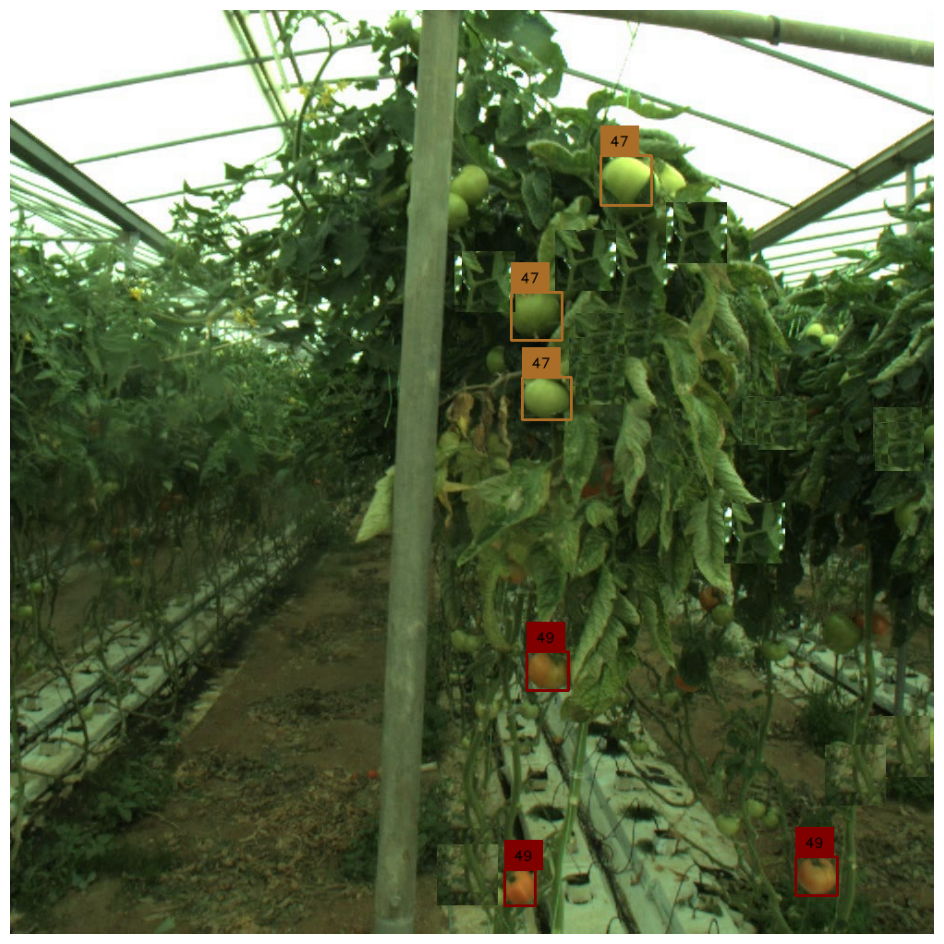

In [ ]:
import cv2
import supervision as sv

image = cv2.imread(f'{HOME}/tomatod-DatasetNinja/Train/img/stereo20190405_132743_p0_snap_488.jpg')

detections = sv.Detections.from_ultralytics(results[0])

bounding_box_annotator = sv.BoundingBoxAnnotator()
label_annotator = sv.LabelAnnotator()

annotated_image = bounding_box_annotator.annotate(
	scene=image, detections=detections)
annotated_image = label_annotator.annotate(
	scene=annotated_image, detections=detections)

sv.plot_image(annotated_image)

YOLOv8


image 1/1 /content/tomatod-DatasetNinja/Train/images/stereo20190405_132743_p0_snap_488.jpg: 640x640 3 apples, 3 oranges, 8.8ms
Speed: 3.0ms preprocess, 8.8ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


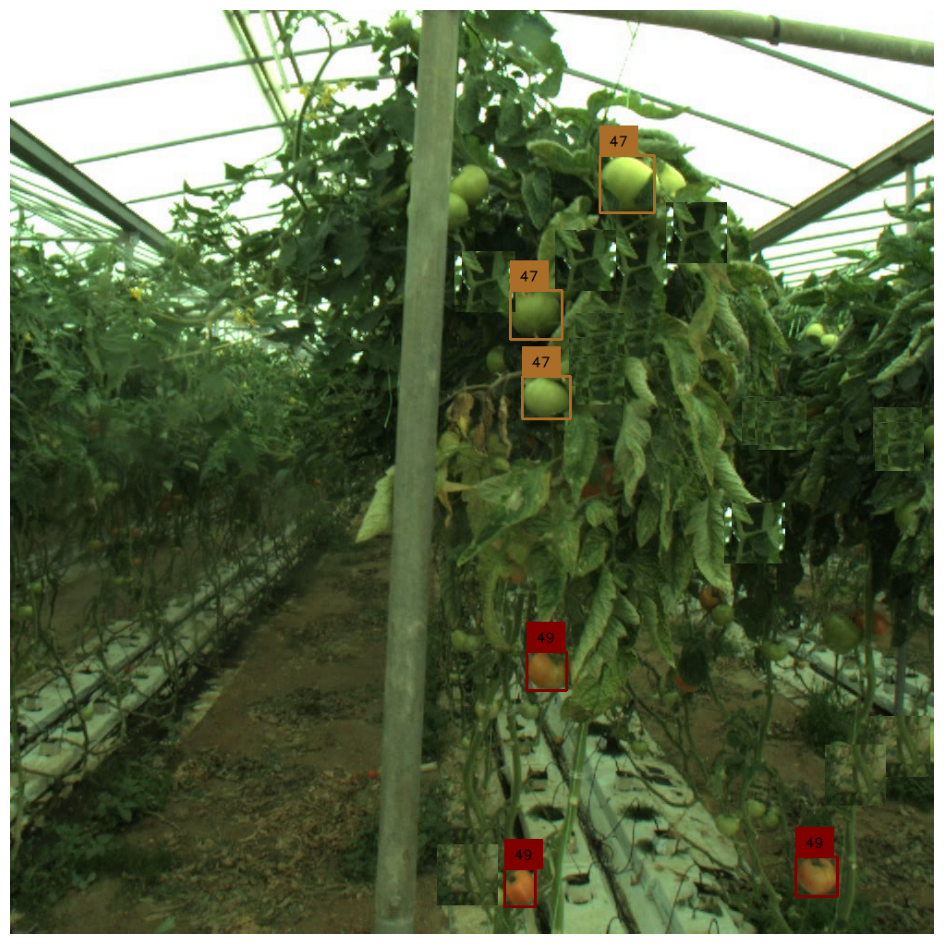

In [ ]:
from ultralytics import YOLO
import cv2
import supervision as sv

model = YOLO('yolov8n.pt')
results = model(source=f'{HOME}/tomatod-DatasetNinja/Train/images/stereo20190405_132743_p0_snap_488.jpg', conf=0.25)
image = cv2.imread(f'{HOME}/tomatod-DatasetNinja/Train/images/stereo20190405_132743_p0_snap_488.jpg')

detections = sv.Detections.from_ultralytics(results[0])

bounding_box_annotator = sv.BoundingBoxAnnotator()
label_annotator = sv.LabelAnnotator()

annotated_image = bounding_box_annotator.annotate(
	scene=image, detections=detections)
annotated_image = label_annotator.annotate(
	scene=annotated_image, detections=detections)

sv.plot_image(annotated_image)

看來 YOLOv8 跟 YOLOv10 表現差不多。

## Train YOLO  
You need to follow directory structure.   
├── Train/  
│   ├── images/      ← 原始圖片   
│   ├── labels/      ← YOLO txt 標註輸出到這（你要新建）  

**Note: filename should be the same in both images and labels.**  

Then, create `data.yaml`

[tutorial](https://blog.csdn.net/qq_42681787/article/details/135506530)  


In [19]:
# create YOLO annotation file (Lables directory)
import os
import json

# modify your path
data_root = '/content/tomatod-DatasetNinja/Train'
# data_root = '/content/tomatod-DatasetNinja/Test'
img_dir = os.path.join(data_root, 'img')
ann_dir = os.path.join(data_root, 'ann')
labels_dir = os.path.join(data_root, 'labels')

# 建立 labels 資料夾
os.makedirs(labels_dir, exist_ok=True)

# 類別映射：YOLO 格式 class ID 要從 0 開始
class_map = {
    'unripe': 0,
    'semi-ripe': 1,
    'fully-ripe': 2
}

# 處理每一個 ann 檔案
for idx, ann_file in enumerate(os.listdir(ann_dir)):
    if not ann_file.endswith('.json'):
        print(ann_file)
        continue

    ann_path = os.path.join(ann_dir, ann_file)
    # txt_path = os.path.join(labels_dir, ann_file.replace('.json', '.txt'))
    txt_path = os.path.join(labels_dir, ann_file.replace('.jpg.json', '.txt'))

    with open(ann_path, 'r') as f:
        data = json.load(f)

    img_w = data['size']['width']
    img_h = data['size']['height']

    lines = []
    for obj in data['objects']:
        cls = obj['classTitle']
        if cls not in class_map:
            continue
        cls_id = class_map[cls]

        x1, y1 = obj['points']['exterior'][0]
        x2, y2 = obj['points']['exterior'][1]
        xc = (x1 + x2) / 2.0 / img_w
        yc = (y1 + y2) / 2.0 / img_h
        w = abs(x2 - x1) / img_w
        h = abs(y2 - y1) / img_h

        lines.append(f"{cls_id} {xc:.6f} {yc:.6f} {w:.6f} {h:.6f}")

    with open(txt_path, 'w') as out_f:
        out_f.write('\n'.join(lines))

# print(len(os.listdir(img_dir)))
# print(len(os.listdir(labels_dir)))

In [ ]:
# training
%cd {HOME}

!yolo task=detect mode=train epochs=50 batch=32 imgsz=256 plots=True \
model={HOME}/weights/yolov10n.pt \
data={HOME}/data.yaml

/content
New https://pypi.org/project/ultralytics/8.3.168 available 😃 Update with 'pip install -U ultralytics'
Ultralytics YOLOv8.1.34 🚀 Python-3.11.13 torch-2.0.1+cu117 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=detect, mode=train, model=/content/weights/yolov10n.pt, data=/content/data.yaml, epochs=50, time=None, patience=100, batch=32, imgsz=256, save=True, save_period=-1, val_period=1, cache=False, device=None, workers=8, project=None, name=train19, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=Fa

In [ ]:
!ls {HOME}/runs/detect/train19/

args.yaml					     results.png
confusion_matrix_normalized.png			     train_batch0.jpg
confusion_matrix.png				     train_batch1.jpg
events.out.tfevents.1752893237.59886a9de952.36759.0  train_batch280.jpg
F1_curve.png					     train_batch281.jpg
labels_correlogram.jpg				     train_batch282.jpg
labels.jpg					     train_batch2.jpg
P_curve.png					     val_batch0_labels.jpg
PR_curve.png					     val_batch0_pred.jpg
R_curve.png					     weights
results.csv


/content


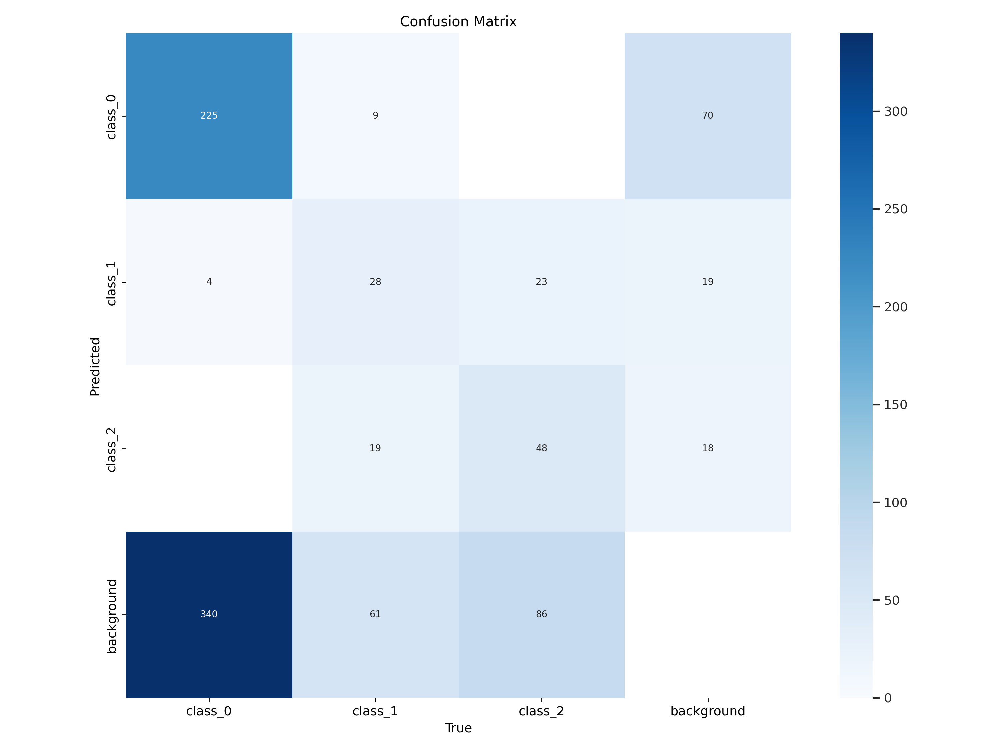

In [ ]:
%cd {HOME}
Image.open(f'{HOME}/runs/detect/train19/confusion_matrix.png')

/content


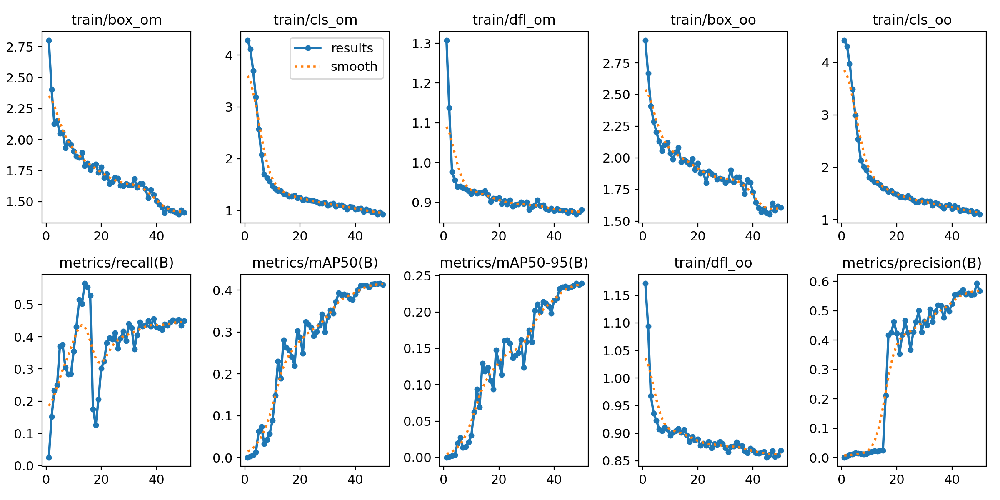

In [ ]:
%cd {HOME}
Image.open(f'{HOME}/runs/detect/train19/results.png')

## Inference with Custom model

In [ ]:
from ultralytics import YOLOv10

model = YOLOv10(f'{HOME}/runs/detect/train19/weights/best.pt')

dataset = sv.DetectionDataset.from_yolo(
    images_directory_path=f"{HOME}/tomatod-DatasetNinja/Test/images",
    annotations_directory_path=f"{HOME}/tomatod-DatasetNinja/Test/labels",
    data_yaml_path=f"{HOME}/data.yaml"
)

bounding_box_annotator = sv.BoundingBoxAnnotator()
label_annotator = sv.LabelAnnotator()


image 1/1 /content/tomatod-DatasetNinja/Test/images/stereo20190406_054921_p0_snap_088.jpg: 256x256 3 class_0s, 1 class_2, 9.5ms
Speed: 1.1ms preprocess, 9.5ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 256)


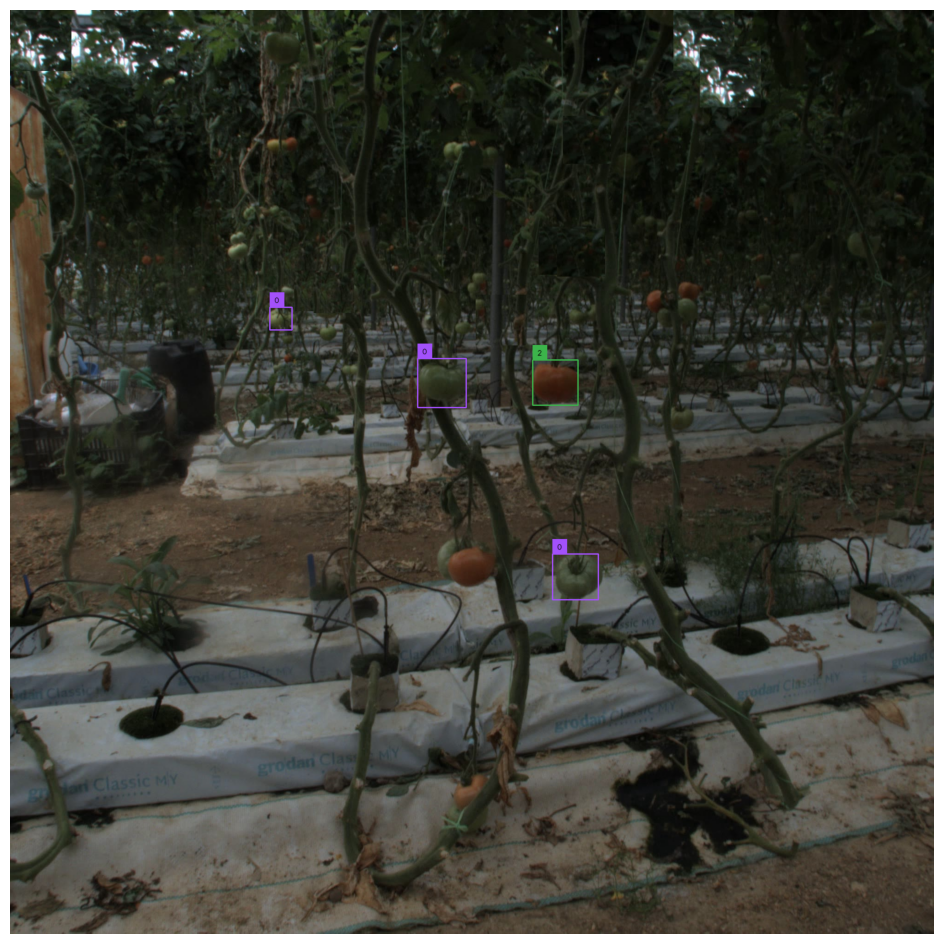

In [ ]:
import random

imgs = os.listdir(f"{HOME}/tomatod-DatasetNinja/Test/images")
random_idx = random.randint(0, len(imgs) - 1)
random_image = imgs[random_idx]

results = model(source=f'{HOME}/tomatod-DatasetNinja/Test/images/{random_image}', conf=0.25)[0]
detections = sv.Detections.from_ultralytics(results)

# read image file by opencv
random_image = cv2.imread(f'{HOME}/tomatod-DatasetNinja/Test/images/{random_image}')
annotated_image = bounding_box_annotator.annotate(
    scene=random_image, detections=detections)
annotated_image = label_annotator.annotate(
    scene=annotated_image, detections=detections)

sv.plot_image(annotated_image)

## Compared with DETR  
原本只是隨便 train 一下，看發現隨便都比 DETR 好..，我還盡量跟 DETR 條件設一樣(影像大小、50個 epoch)

## Further optimized

In [28]:
# training
%cd {HOME}

!yolo task=detect mode=train epochs=100 batch=16 imgsz=960 plots=True \
model={HOME}/weights/yolov10n.pt \
data={HOME}/data.yaml

/content
New https://pypi.org/project/ultralytics/8.3.168 available 😃 Update with 'pip install -U ultralytics'
Ultralytics YOLOv8.1.34 🚀 Python-3.11.13 torch-2.0.1+cu117 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=detect, mode=train, model=/content/weights/yolov10n.pt, data=/content/data.yaml, epochs=100, time=None, patience=100, batch=16, imgsz=960, save=True, save_period=-1, val_period=1, cache=False, device=None, workers=8, project=None, name=train7, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=Fa

/content


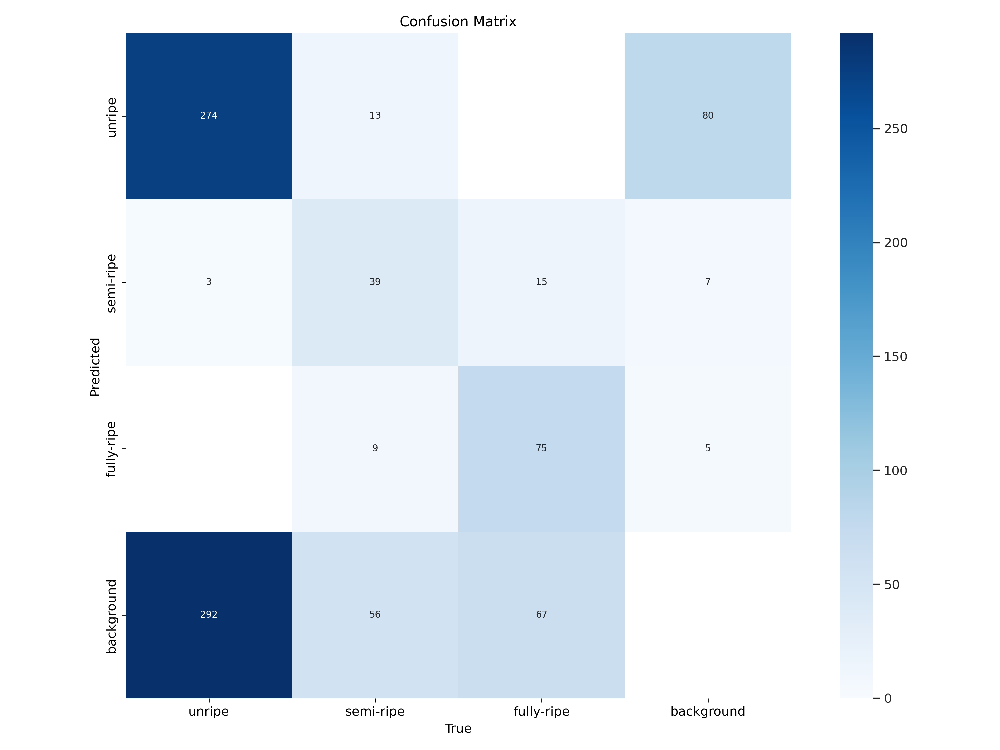

In [29]:
from PIL import Image
%cd {HOME}
Image.open(f'{HOME}/runs/detect/train7/confusion_matrix.png')

/content


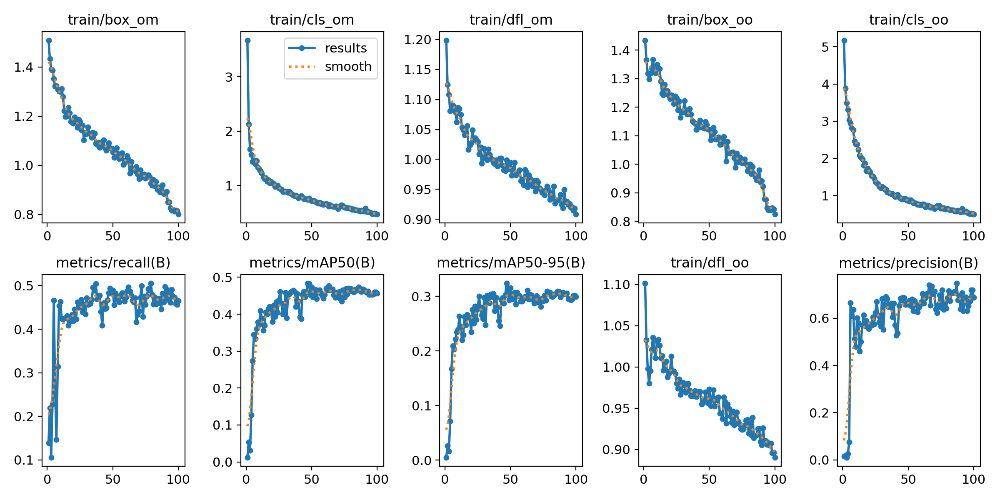

In [30]:
%cd {HOME}
Image.open(f'{HOME}/runs/detect/train7/results.png')

## 📊 YOLOv10 訓練結果分析筆記（results.png 解讀）

### 1️⃣ Train Loss（訓練損失）
| 名稱            | 說明                                   | 趨勢建議             |
|------------------|----------------------------------------|----------------------|
| `train/box_om`   | One-to-many Head BBox 損失                | 越低越好，越平穩越佳 |
| `train/box_oo`   | One-to-one Head BBox 損失 | 越低越好              |
| `train/cls_om`   | One-to-many Head 分類損失（物件類別分類錯誤）              | 越低越好              |
| `train/cls_oo`   | One-toone Head 分類損失（推測為 output-output 之間差異） | 越低越好              |
| `train/dfl`      | Distribution Focal Loss，bbox 精準度用    | 越低越好              |

---

### 2️⃣ Detection Metrics（驗證指標）
| 指標名稱             | 解釋                                      | 趨勢建議             |
|----------------------|-------------------------------------------|----------------------|
| `metrics/precision`  | 真陽性比率，高表示預測正確率高             | 越高越好              |
| `metrics/recall`     | 抓到所有正確框的比率，高表示不漏抓          | 越高越好              |
| `metrics/mAP_0.5`    | IoU=0.5 下的 mAP，衡量整體準確率            | >0.5 表示可接受       |
| `metrics/mAP_0.5:0.95` | IoU 0.5~0.95 下平均 mAP，嚴格準確率衡量     | 越高泛化越好          |

---

In [33]:
from ultralytics import YOLOv10
import supervision as sv

model = YOLOv10(f'{HOME}/runs/detect/train7/weights/best.pt')

dataset = sv.DetectionDataset.from_yolo(
    images_directory_path=f"{HOME}/tomatod-DatasetNinja/Test/images",
    annotations_directory_path=f"{HOME}/tomatod-DatasetNinja/Test/labels",
    data_yaml_path=f"{HOME}/data.yaml"
)

bounding_box_annotator = sv.BoundingBoxAnnotator()
label_annotator = sv.LabelAnnotator()

image_filename:  stereo20190405_133623_p3_snap_006.jpg
物件類別: unripe, bbox: (1105, 1300), (1187, 1382)
物件類別: semi-ripe, bbox: (1417, 666), (1527, 776)
物件類別: semi-ripe, bbox: (1535, 657), (1611, 733)
物件類別: unripe, bbox: (1794, 1471), (1886, 1563)
物件類別: fully-ripe, bbox: (488, 1136), (606, 1254)
物件類別: unripe, bbox: (1538, 1662), (1656, 1780)
物件類別: unripe, bbox: (1423, 766), (1523, 866)
物件類別: semi-ripe, bbox: (372, 1656), (490, 1774)
物件類別: unripe, bbox: (707, 1394), (771, 1458)
物件類別: unripe, bbox: (612, 1145), (694, 1227)
物件類別: unripe, bbox: (1778, 1828), (1878, 1928)
物件類別: fully-ripe, bbox: (1279, 563), (1357, 641)
物件類別: unripe, bbox: (1581, 1070), (1653, 1142)
物件類別: semi-ripe, bbox: (1793, 1032), (1881, 1120)
物件類別: unripe, bbox: (1879, 497), (1999, 617)
物件類別: unripe, bbox: (1814, 433), (1934, 553)
物件類別: unripe, bbox: (912, 592), (1048, 728)
Ground Truth


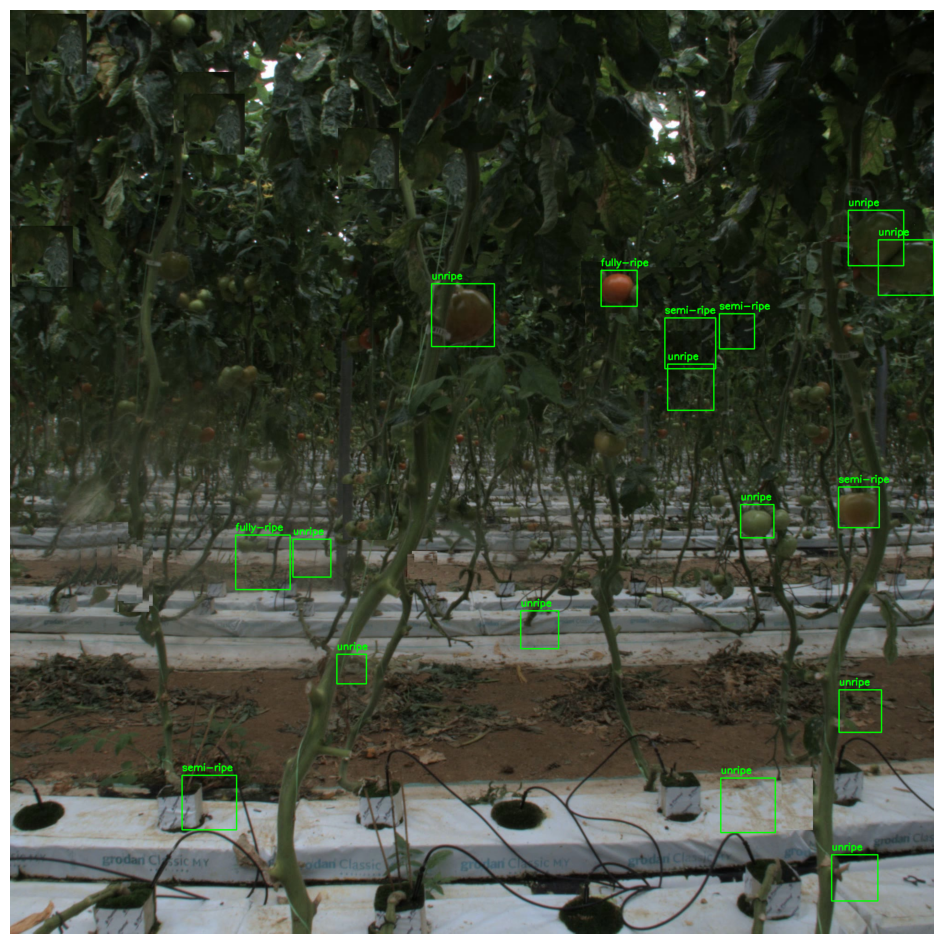


image 1/1 /content/tomatod-DatasetNinja/Test/images/stereo20190405_133623_p3_snap_006.jpg: 960x960 5 unripes, 2 semi-ripes, 1 fully-ripe, 18.1ms
Speed: 14.1ms preprocess, 18.1ms inference, 1.6ms postprocess per image at shape (1, 3, 960, 960)
Prediction


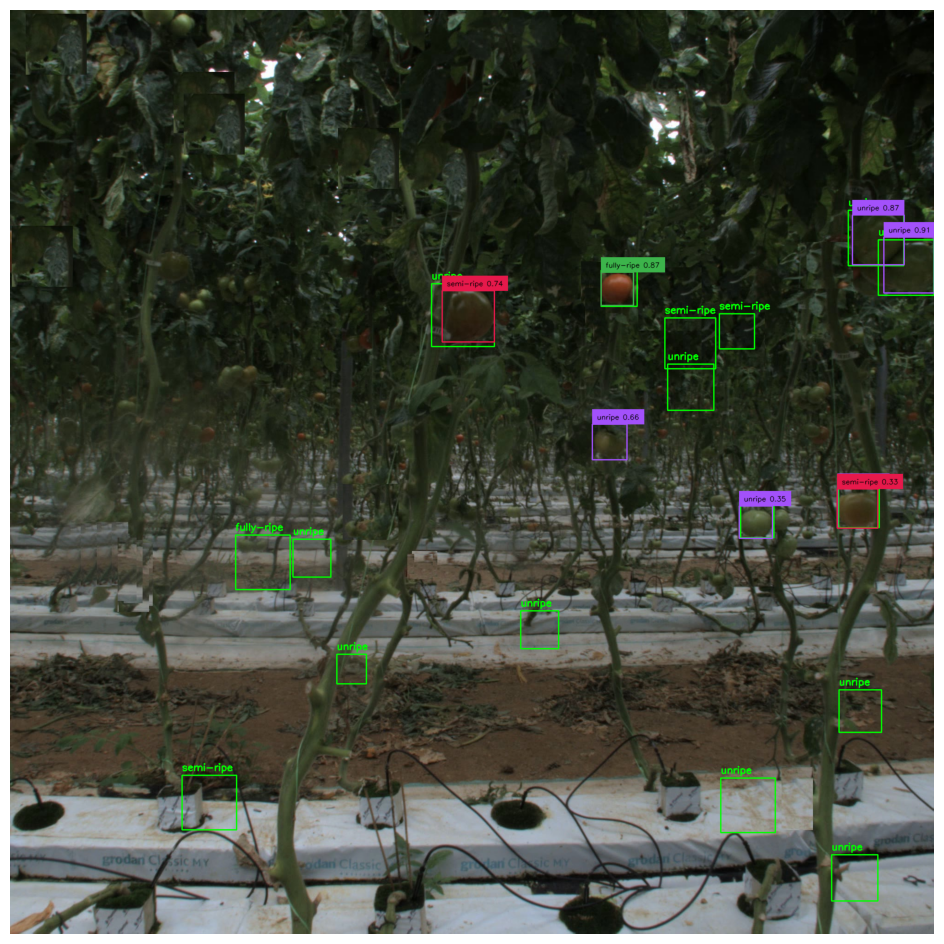

In [34]:
import random
import cv2
import numpy as np
import torch
import supervision as sv

# utils
label2id = {'unripe':0, 'semi-ripe':1, 'fully-ripe':2}
id2label = {v: k for k, v in label2id.items()}
# Create box annotator with smaller text and thinner lines
box_annotator = sv.BoxAnnotator(
    thickness=1,  # thinner lines
    text_thickness=1,  # thinner text
    text_scale=0.5,  # smaller text
    text_padding=3  # less padding
)

# select random image
imgs = os.listdir(f"{HOME}/tomatod-DatasetNinja/Test/images")
random_idx = random.randint(0, len(imgs) - 1)
random_image = imgs[random_idx]
# print filename
print("image_filename: ", random_image)

# --- 處理 image ---
image = cv2.imread(f'{HOME}/tomatod-DatasetNinja/Test/images/{random_image}')

# 讀取 annotation JSON
with open(f'{HOME}/tomatod-DatasetNinja/Test/ann/{random_image}.json', 'r', encoding='utf-8') as f:
    data = json.load(f)

# --- Ground Truth ---
# 解析並繪製每個物件的 bbox
for obj in data['objects']:
    class_name = obj['classTitle']

    # 取得 bbox 左上與右下點座標 (x1,y1), (x2,y2)
    (x1, y1), (x2, y2) = obj['points']['exterior']

    # 印出 bbox 資訊
    print(f"物件類別: {class_name}, bbox: ({x1}, {y1}), ({x2}, {y2})")

    # 繪製矩形框 - 原圖
    pt1_orig = (int(x1), int(y1))
    pt2_orig = (int(x2), int(y2))
    cv2.rectangle(image, pt1_orig, pt2_orig, color=(0, 255, 0), thickness=2)
    cv2.putText(image, class_name, (pt1_orig[0], pt1_orig[1]-10),
                cv2.FONT_HERSHEY_SIMPLEX, 0.7, (0, 255, 0), 2)

print("Ground Truth")
sv.plot_image(image)

# --- Prediction ---
results = model(source=f'{HOME}/tomatod-DatasetNinja/Test/images/{random_image}', conf=0.25)[0]
detections = sv.Detections.from_ultralytics(results)

# read image file by opencv
annotated_image = bounding_box_annotator.annotate(
    scene=image, detections=detections)

id2label = {0:'unripe', 1:'semi-ripe', 2:'fully-ripe'}
labels = [
    f"{id2label[class_id]} {confidence:0.2f}"
    for xyxy, mask, confidence, class_id, tracker_id
    in detections
]
annotated_image = label_annotator.annotate(
    scene=annotated_image, detections=detections, labels=labels)

print("Prediction")
sv.plot_image(annotated_image)